# CMI Prediction 22 sii

---

## NOT DONE YET

[]

## TARGET

['sii']


## DONE

['PCIAT-PCIAT_Total','PCIAT-PCIAT_01','PCIAT-PCIAT_02','PCIAT-PCIAT_03','PCIAT-PCIAT_04','PCIAT-PCIAT_05','PCIAT-PCIAT_06','PCIAT-PCIAT_07','PCIAT-PCIAT_08','PCIAT-PCIAT_09','PCIAT-PCIAT_10','PCIAT-PCIAT_11','PCIAT-PCIAT_12','PCIAT-PCIAT_13','PCIAT-PCIAT_14','PCIAT-PCIAT_15','PCIAT-PCIAT_16','PCIAT-PCIAT_17','PCIAT-PCIAT_18','PCIAT-PCIAT_19','PCIAT-PCIAT_20','PCIAT-Season']

---

# TARGETS

['PCIAT-PCIAT_01', 'PCIAT-PCIAT_02', 'PCIAT-PCIAT_03', 'PCIAT-PCIAT_04', 'PCIAT-PCIAT_05', 'PCIAT-PCIAT_06', 'PCIAT-PCIAT_07', 'PCIAT-PCIAT_08', 'PCIAT-PCIAT_09', 'PCIAT-PCIAT_10', 'PCIAT-PCIAT_11', 'PCIAT-PCIAT_12', 'PCIAT-PCIAT_13', 'PCIAT-PCIAT_14', 'PCIAT-PCIAT_15', 'PCIAT-PCIAT_16', 'PCIAT-PCIAT_17', 'PCIAT-PCIAT_18', 'PCIAT-PCIAT_19', 'PCIAT-PCIAT_20', 'PCIAT-PCIAT_Total', 'PCIAT-Season', 'sii']

---

In [1]:
import os
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
import seaborn as sns
from contextlib import contextmanager
from time import time
from tqdm import tqdm
import lightgbm as lgbm
import category_encoders as ce
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import classification_report, log_loss, accuracy_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split

# Data preparation

In [2]:
train0= pd.read_csv("/kaggle/input/cmi-prediction-21-pciat-season/TRAIN21.csv")
TEST0= pd.read_csv("/kaggle/input/cmi-prediction-21-pciat-season/TEST21.csv")
cols=TEST0.columns.tolist()
display(train0[0:2])

,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,...,PCIAT-PCIAT_12,PCIAT-PCIAT_13,PCIAT-PCIAT_14,PCIAT-PCIAT_15,PCIAT-PCIAT_16,PCIAT-PCIAT_17,PCIAT-PCIAT_18,PCIAT-PCIAT_19,PCIAT-PCIAT_20,PCIAT-Season
0,0.0,0.0,5.0,0.0,4.0,51.0,0.0,16.877316,46.0,50.8,...,0.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,0.0
1,2281.0,2.0,9.0,0.0,1.0,NaN,0.0,14.035590,48.0,46.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [3]:
print(len(train0),len(TEST0))

4752 20


In [4]:
targets=['PCIAT-PCIAT_01', 'PCIAT-PCIAT_02', 'PCIAT-PCIAT_03', 'PCIAT-PCIAT_04', 'PCIAT-PCIAT_05', 'PCIAT-PCIAT_06', 'PCIAT-PCIAT_07', 'PCIAT-PCIAT_08', 'PCIAT-PCIAT_09', 'PCIAT-PCIAT_10', 'PCIAT-PCIAT_11', 'PCIAT-PCIAT_12', 'PCIAT-PCIAT_13', 'PCIAT-PCIAT_14', 'PCIAT-PCIAT_15', 'PCIAT-PCIAT_16', 'PCIAT-PCIAT_17', 'PCIAT-PCIAT_18', 'PCIAT-PCIAT_19', 'PCIAT-PCIAT_20', 'PCIAT-PCIAT_Total', 'PCIAT-Season', 'sii']
print(targets)

['PCIAT-PCIAT_01', 'PCIAT-PCIAT_02', 'PCIAT-PCIAT_03', 'PCIAT-PCIAT_04', 'PCIAT-PCIAT_05', 'PCIAT-PCIAT_06', 'PCIAT-PCIAT_07', 'PCIAT-PCIAT_08', 'PCIAT-PCIAT_09', 'PCIAT-PCIAT_10', 'PCIAT-PCIAT_11', 'PCIAT-PCIAT_12', 'PCIAT-PCIAT_13', 'PCIAT-PCIAT_14', 'PCIAT-PCIAT_15', 'PCIAT-PCIAT_16', 'PCIAT-PCIAT_17', 'PCIAT-PCIAT_18', 'PCIAT-PCIAT_19', 'PCIAT-PCIAT_20', 'PCIAT-PCIAT_Total', 'PCIAT-Season', 'sii']


In [5]:
from sklearn.preprocessing import LabelEncoder

def labelencoder(df_train, df_test):
    combined_df = pd.concat([df_train, df_test])
    for c in combined_df.columns:
        if combined_df[c].dtype == 'object':
            combined_df[c] = combined_df[c].fillna('N')
            lbl = LabelEncoder()
            lbl.fit(list(combined_df[c].values))
            combined_df[c] = lbl.transform(combined_df[c].values)
    return combined_df.iloc[:len(df_train)], combined_df.iloc[len(df_train):]

In [6]:
train1,TEST1=labelencoder(train0,TEST0)

# Target set & Train/Test split

In [7]:
target=targets[22]
print(target)
dataX=train1.drop(target,axis=1)
dataY=train1[target]
TEST1X=TEST1.drop(target,axis=1)
TEST1Y=TEST1[target]

sii


In [8]:
trainX = dataX[dataY.notnull()]
trainY = dataY[dataY.notnull()]
testX = dataX[dataY.isnull()]
testY = dataY[dataY.isnull()] 

In [9]:
display(trainX)

,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,...,PCIAT-PCIAT_12,PCIAT-PCIAT_13,PCIAT-PCIAT_14,PCIAT-PCIAT_15,PCIAT-PCIAT_16,PCIAT-PCIAT_17,PCIAT-PCIAT_18,PCIAT-PCIAT_19,PCIAT-PCIAT_20,PCIAT-Season
0,0,0,5.0,0.0,4,51.0,0,16.877316,46.0,50.8,...,0.000000,4.000000,4.000000,4.000000,4.000000,4.00000,4.000000,2.000000,4.000000,0.0
1,1433,2,9.0,0.0,1,NaN,0,14.035590,48.0,46.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0
2,579,2,10.0,1.0,0,71.0,0,16.648696,56.5,75.6,...,0.000000,1.000000,1.000000,1.000000,0.000000,2.00000,2.000000,1.000000,1.000000,0.0
3,66,3,9.0,0.0,0,71.0,3,18.292347,56.0,81.6,...,0.000000,3.000000,0.000000,0.000000,3.000000,4.00000,3.000000,4.000000,1.000000,3.0
4,1429,1,13.0,1.0,4,50.0,3,22.279952,59.5,112.2,...,1.000000,3.000000,3.000000,2.000000,1.000000,3.00000,1.000000,2.000000,1.000000,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2731,2573,2,9.0,0.0,2,50.0,0,23.904722,54.5,101.0,...,1.000000,3.000000,4.000000,4.000000,4.000000,4.00000,4.000000,3.207223,4.000000,0.0
2732,755,2,9.0,0.0,3,80.0,4,13.301439,54.5,56.2,...,0.000000,4.000000,1.000000,4.000000,4.000000,4.00000,3.858465,1.845337,1.000000,0.0
2733,1290,0,13.0,0.0,0,65.0,0,14.270311,56.5,64.8,...,1.000000,2.000000,2.000000,3.000000,3.000000,3.00000,3.000000,3.000000,1.981836,0.0
2734,928,0,18.0,1.0,2,60.0,4,21.014782,67.5,136.2,...,1.000000,1.000000,2.000000,2.000000,1.000000,2.00000,1.000000,1.328007,1.123049,4.0


In [10]:
display(testX)

,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,...,PCIAT-PCIAT_12,PCIAT-PCIAT_13,PCIAT-PCIAT_14,PCIAT-PCIAT_15,PCIAT-PCIAT_16,PCIAT-PCIAT_17,PCIAT-PCIAT_18,PCIAT-PCIAT_19,PCIAT-PCIAT_20,PCIAT-Season
2736,2179,1,18.0,1.0,3,NaN,1,NaN,NaN,NaN,...,0.135069,0.252845,0.710340,1.747951,1.029235,0.639813,0.163092,0.813127,0.735063,1.000000
2737,1266,0,10.0,1.0,1,NaN,0,16.861286,59.25,84.2,...,0.051892,0.456825,0.858465,1.619816,1.087881,0.608330,0.577699,0.684218,0.646379,1.000000
2738,1566,2,15.0,0.0,1,NaN,2,NaN,NaN,NaN,...,0.050375,0.091232,0.780516,1.692041,1.157030,0.370432,0.215795,0.714065,0.707219,1.000000
2739,2327,2,19.0,1.0,3,NaN,1,NaN,NaN,NaN,...,0.142308,0.157042,0.943106,1.745487,1.267161,0.210551,0.326991,0.557064,0.762838,1.000000
2740,1561,1,11.0,1.0,1,NaN,1,NaN,NaN,NaN,...,0.064930,0.130132,0.842140,1.670166,1.299754,0.416474,0.548668,0.673609,0.776586,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4747,3980,5,NaN,NaN,6,NaN,6,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.635726
4748,3980,5,NaN,NaN,6,NaN,6,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.953140
4749,3980,5,NaN,NaN,6,NaN,6,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.999312
4750,3980,5,NaN,NaN,6,NaN,6,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.120683


In [11]:
#trainX, testX, trainY, testY = train_test_split(dataX, dataY, test_size=0.2, random_state=42)

In [12]:
df_columns = list(trainX.columns)
print(df_columns)

['id', 'Basic_Demos-Enroll_Season', 'Basic_Demos-Age', 'Basic_Demos-Sex', 'CGAS-Season', 'CGAS-CGAS_Score', 'Physical-Season', 'Physical-BMI', 'Physical-Height', 'Physical-Weight', 'Physical-Waist_Circumference', 'Physical-Diastolic_BP', 'Physical-HeartRate', 'Physical-Systolic_BP', 'Fitness_Endurance-Season', 'Fitness_Endurance-Max_Stage', 'Fitness_Endurance-Time_Mins', 'Fitness_Endurance-Time_Sec', 'FGC-Season', 'FGC-FGC_CU', 'FGC-FGC_CU_Zone', 'FGC-FGC_GSND', 'FGC-FGC_GSND_Zone', 'FGC-FGC_GSD', 'FGC-FGC_GSD_Zone', 'FGC-FGC_PU', 'FGC-FGC_PU_Zone', 'FGC-FGC_SRL', 'FGC-FGC_SRL_Zone', 'FGC-FGC_SRR', 'FGC-FGC_SRR_Zone', 'FGC-FGC_TL', 'FGC-FGC_TL_Zone', 'BIA-Season', 'BIA-BIA_Activity_Level_num', 'BIA-BIA_BMC', 'BIA-BIA_BMI', 'BIA-BIA_BMR', 'BIA-BIA_DEE', 'BIA-BIA_ECW', 'BIA-BIA_FFM', 'BIA-BIA_FFMI', 'BIA-BIA_FMI', 'BIA-BIA_Fat', 'BIA-BIA_Frame_num', 'BIA-BIA_ICW', 'BIA-BIA_LDM', 'BIA-BIA_LST', 'BIA-BIA_SMM', 'BIA-BIA_TBW', 'PAQ_A-Season', 'PAQ_A-PAQ_A_Total', 'PAQ_C-Season', 'PAQ_C-PAQ_C

In [13]:
train_df=trainX
test_df=testX

In [14]:
train_df.columns=df_columns
test_df.columns=df_columns

In [15]:
def create_numeric_feature(input_df):
    use_columns = df_columns 
    return input_df[use_columns].copy()

In [16]:
from contextlib import contextmanager
from time import time

class Timer:
    def __init__(self, logger=None, format_str='{:.3f}[s]', prefix=None, suffix=None, sep=' '):

        if prefix: format_str = str(prefix) + sep + format_str
        if suffix: format_str = format_str + sep + str(suffix)
        self.format_str = format_str
        self.logger = logger
        self.start = None
        self.end = None

    @property
    def duration(self):
        if self.end is None:
            return 0
        return self.end - self.start

    def __enter__(self):
        self.start = time()

    def __exit__(self, exc_type, exc_val, exc_tb):
        self.end = time()
        out_str = self.format_str.format(self.duration)
        if self.logger:
            self.logger.info(out_str)
        else:
            print(out_str)

In [17]:
from tqdm import tqdm

def to_feature(input_df):

    processors = [
        create_numeric_feature,
    ]
    
    out_df = pd.DataFrame()
    
    for func in tqdm(processors, total=len(processors)):
        with Timer(prefix='create' + func.__name__ + ' '):
            _df = func(input_df)

        assert len(_df) == len(input_df), func.__name__
        out_df = pd.concat([out_df, _df], axis=1)
        
    return out_df

In [18]:
train_feat_df = to_feature(train_df)
test_feat_df = to_feature(test_df)

100%|██████████| 1/1 [00:00<00:00, 115.44it/s]


createcreate_numeric_feature  0.007[s]


100%|██████████| 1/1 [00:00<00:00, 163.71it/s]

createcreate_numeric_feature  0.005[s]


# Model

In [19]:
import lightgbm as lgbm
from sklearn.metrics import mean_squared_error

def fit_lgbm(X, y, cv, 
             params: dict=None, 
             ):

    if params is None:
        params = {}

    models = []
    oof_pred = np.zeros_like(y, dtype=float)

    for i, (idx_train, idx_valid) in enumerate(cv): 
        x_train, y_train = X[idx_train], y[idx_train]
        x_valid, y_valid = X[idx_valid], y[idx_valid]

        clf = lgbm.LGBMRegressor(**params)
        
        with Timer(prefix='fit fold={} '.format(i)):
            clf.fit(x_train, y_train, 
                    eval_set=[(x_valid, y_valid)]
                   )

        pred_i = clf.predict(x_valid)
        oof_pred[idx_valid] = pred_i
        models.append(clf)
        print(f'Fold {i} RMSLE: {mean_squared_error(y_valid, pred_i) ** .5:.4f}')
        print()

    score = mean_squared_error(y, oof_pred) ** .5
    print('-' * 50)
    print('FINISHED | Whole RMSLE: {:.4f}'.format(score))
    return oof_pred, models

In [20]:
params = {
    'objective': 'rmse', 
    'learning_rate': .1,
    'reg_lambda': 1.,
    'reg_alpha': .1,
    'max_depth': 5, 
    'n_estimators': 10000, 
    'colsample_bytree': .5, 
    'min_child_samples': 10,
    'subsample_freq': 3,
    'subsample': .9,
    'importance_type': 'gain', 
    'random_state': 71,
    'num_leaves': 62
}

In [21]:
y = trainY
ydf=pd.DataFrame(y)

In [22]:
from sklearn.model_selection import KFold

for i in range(1):
    fold = KFold(n_splits=5, shuffle=True, random_state=71)
    ydfi=ydf.iloc[:,i]
    y=np.array(ydfi)
    cv = list(fold.split(train_feat_df, y))
    oof, models = fit_lgbm(train_feat_df.values, y, cv, params=params)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002883 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6333
[LightGBM] [Info] Number of data points in the train set: 2188, number of used features: 81
[LightGBM] [Info] Start training from score 0.597806
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

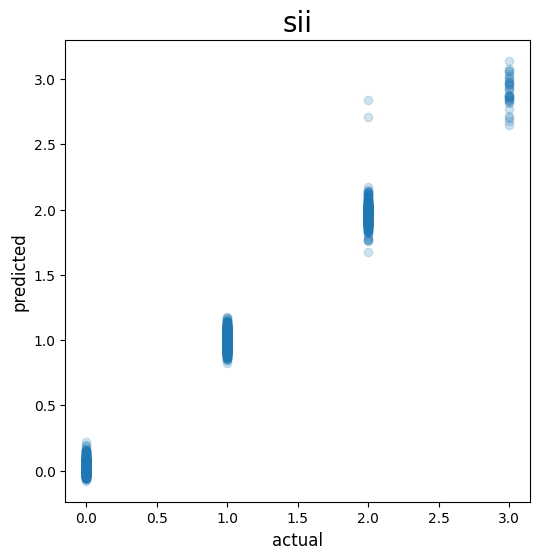

In [23]:
    fig,ax = plt.subplots(figsize=(6,6))
    ax.set_title(target,fontsize=20)
    ax.set_ylabel('predicted',fontsize=12)
    ax.set_xlabel('actual',fontsize=12)
    ax.scatter(y,oof,alpha=0.2)

# Visualize Importance

In [24]:
def visualize_importance(models, feat_train_df):

    feature_importance_df = pd.DataFrame()
    for i, model in enumerate(models):
        _df = pd.DataFrame()
        _df['feature_importance'] = model.feature_importances_
        _df['column'] = feat_train_df.columns
        _df['fold'] = i + 1
        feature_importance_df = pd.concat([feature_importance_df, _df], 
                                          axis=0, ignore_index=True)

    order = feature_importance_df.groupby('column')\
        .sum()[['feature_importance']]\
        .sort_values('feature_importance', ascending=False).index[:50]

    fig, ax = plt.subplots(figsize=(8, max(6, len(order) * .25)))
    sns.boxenplot(data=feature_importance_df, 
                  x='feature_importance', 
                  y='column', 
                  order=order, 
                  ax=ax, 
                  palette='viridis', 
                  orient='h')
    
    ax.tick_params(axis='x', rotation=0)
    #ax.set_title('Importance')
    ax.grid()
    fig.tight_layout()
    
    return fig,ax

#fig, ax = visualize_importance(models, train_feat_df)

In [25]:
for i in range(1):
    fold = KFold(n_splits=5, shuffle=True, random_state=71)
    ydfi=ydf.iloc[:,i]
    y=np.array(ydfi)
    cv = list(fold.split(train_feat_df, y))
    oof, models = fit_lgbm(train_feat_df.values, y, cv, params=params)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6333
[LightGBM] [Info] Number of data points in the train set: 2188, number of used features: 81
[LightGBM] [Info] Start training from score 0.597806
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

/opt/conda/lib/python3.10/site-packages/seaborn/categorical.py:1794: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/categorical.py:1794: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/categorical.py:1794: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/categorical.py:1794: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

Text(0.5, 1.0, 'sii Imortance')

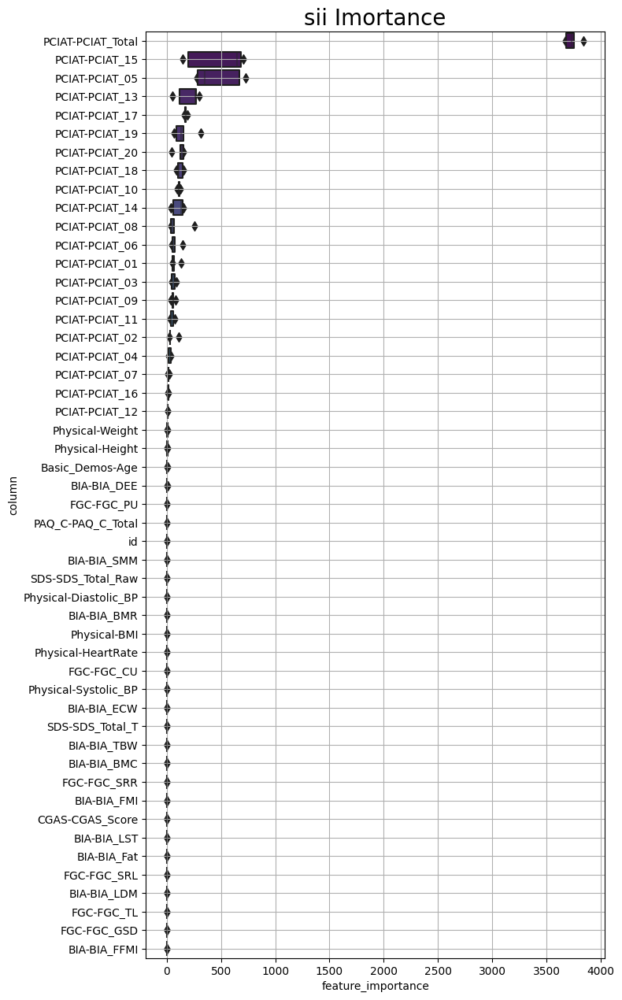

In [26]:
    fig, ax = visualize_importance(models, train_feat_df)
    ax.set_title(target +' Imortance',fontsize=20)

In [27]:
preds=[]
for i in range(5):
    preds += [models[i].predict(test_feat_df.values)/5]

predsT=np.array(preds).T
preds2=[]
for item in predsT:
    value=sum(item)
    preds2+=[value]
print(preds2[0:5])

[0.015362619325749744, 0.010375042429201339, 0.011439828584990845, 0.019557345475661993, 0.01673555071163738]


    fig,ax = plt.subplots(figsize=(6,6))
    ax.set_title(target,fontsize=20)
    ax.set_ylabel('predicted',fontsize=12)
    ax.set_xlabel('actual',fontsize=12)
    ax.scatter(testY,preds2,alpha=0.2)

# Predict trainY

In [28]:
test_preds=[]
for i in range(5):
    test_preds += [models[i].predict(testX.values)/5]
    
test_predsT=np.array(test_preds).T
test_preds2=[]
for item in test_predsT:
    value=sum(item)
    test_preds2+=[value]

print(test_preds2[0:5])  
print(len(test_preds2))

[0.015362619325749744, 0.010375042429201339, 0.011439828584990845, 0.019557345475661993, 0.01673555071163738]
2016


In [29]:
testX = dataX[dataY.isnull()]
display(testX)

testX[target] = test_preds2

testS = testX
display(testS)

,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,...,PCIAT-PCIAT_12,PCIAT-PCIAT_13,PCIAT-PCIAT_14,PCIAT-PCIAT_15,PCIAT-PCIAT_16,PCIAT-PCIAT_17,PCIAT-PCIAT_18,PCIAT-PCIAT_19,PCIAT-PCIAT_20,PCIAT-Season
2736,2179,1,18.0,1.0,3,NaN,1,NaN,NaN,NaN,...,0.135069,0.252845,0.710340,1.747951,1.029235,0.639813,0.163092,0.813127,0.735063,1.000000
2737,1266,0,10.0,1.0,1,NaN,0,16.861286,59.25,84.2,...,0.051892,0.456825,0.858465,1.619816,1.087881,0.608330,0.577699,0.684218,0.646379,1.000000
2738,1566,2,15.0,0.0,1,NaN,2,NaN,NaN,NaN,...,0.050375,0.091232,0.780516,1.692041,1.157030,0.370432,0.215795,0.714065,0.707219,1.000000
2739,2327,2,19.0,1.0,3,NaN,1,NaN,NaN,NaN,...,0.142308,0.157042,0.943106,1.745487,1.267161,0.210551,0.326991,0.557064,0.762838,1.000000
2740,1561,1,11.0,1.0,1,NaN,1,NaN,NaN,NaN,...,0.064930,0.130132,0.842140,1.670166,1.299754,0.416474,0.548668,0.673609,0.776586,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4747,3980,5,NaN,NaN,6,NaN,6,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.635726
4748,3980,5,NaN,NaN,6,NaN,6,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.953140
4749,3980,5,NaN,NaN,6,NaN,6,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.999312
4750,3980,5,NaN,NaN,6,NaN,6,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.120683


/tmp/ipykernel_17/2739187610.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  testX[target] = test_preds2


,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,...,PCIAT-PCIAT_13,PCIAT-PCIAT_14,PCIAT-PCIAT_15,PCIAT-PCIAT_16,PCIAT-PCIAT_17,PCIAT-PCIAT_18,PCIAT-PCIAT_19,PCIAT-PCIAT_20,PCIAT-Season,sii
2736,2179,1,18.0,1.0,3,NaN,1,NaN,NaN,NaN,...,0.252845,0.710340,1.747951,1.029235,0.639813,0.163092,0.813127,0.735063,1.000000,0.015363
2737,1266,0,10.0,1.0,1,NaN,0,16.861286,59.25,84.2,...,0.456825,0.858465,1.619816,1.087881,0.608330,0.577699,0.684218,0.646379,1.000000,0.010375
2738,1566,2,15.0,0.0,1,NaN,2,NaN,NaN,NaN,...,0.091232,0.780516,1.692041,1.157030,0.370432,0.215795,0.714065,0.707219,1.000000,0.011440
2739,2327,2,19.0,1.0,3,NaN,1,NaN,NaN,NaN,...,0.157042,0.943106,1.745487,1.267161,0.210551,0.326991,0.557064,0.762838,1.000000,0.019557
2740,1561,1,11.0,1.0,1,NaN,1,NaN,NaN,NaN,...,0.130132,0.842140,1.670166,1.299754,0.416474,0.548668,0.673609,0.776586,1.000000,0.016736
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4747,3980,5,NaN,NaN,6,NaN,6,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.635726,-0.001904
4748,3980,5,NaN,NaN,6,NaN,6,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.953140,-0.001378
4749,3980,5,NaN,NaN,6,NaN,6,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.999312,-0.001363
4750,3980,5,NaN,NaN,6,NaN,6,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.120683,-0.001363


In [30]:
trainX = dataX[dataY.notnull()]
trainY = dataY[dataY.notnull()]
trainS = pd.concat([trainX,trainY],axis=1)
display(trainS)

,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,...,PCIAT-PCIAT_13,PCIAT-PCIAT_14,PCIAT-PCIAT_15,PCIAT-PCIAT_16,PCIAT-PCIAT_17,PCIAT-PCIAT_18,PCIAT-PCIAT_19,PCIAT-PCIAT_20,PCIAT-Season,sii
0,0,0,5.0,0.0,4,51.0,0,16.877316,46.0,50.8,...,4.000000,4.000000,4.000000,4.000000,4.00000,4.000000,2.000000,4.000000,0.0,2.0
1,1433,2,9.0,0.0,1,NaN,0,14.035590,48.0,46.0,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.0
2,579,2,10.0,1.0,0,71.0,0,16.648696,56.5,75.6,...,1.000000,1.000000,1.000000,0.000000,2.00000,2.000000,1.000000,1.000000,0.0,0.0
3,66,3,9.0,0.0,0,71.0,3,18.292347,56.0,81.6,...,3.000000,0.000000,0.000000,3.000000,4.00000,3.000000,4.000000,1.000000,3.0,1.0
4,1429,1,13.0,1.0,4,50.0,3,22.279952,59.5,112.2,...,3.000000,3.000000,2.000000,1.000000,3.00000,1.000000,2.000000,1.000000,3.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2731,2573,2,9.0,0.0,2,50.0,0,23.904722,54.5,101.0,...,3.000000,4.000000,4.000000,4.000000,4.00000,4.000000,3.207223,4.000000,0.0,2.0
2732,755,2,9.0,0.0,3,80.0,4,13.301439,54.5,56.2,...,4.000000,1.000000,4.000000,4.000000,4.00000,3.858465,1.845337,1.000000,0.0,1.0
2733,1290,0,13.0,0.0,0,65.0,0,14.270311,56.5,64.8,...,2.000000,2.000000,3.000000,3.000000,3.00000,3.000000,3.000000,1.981836,0.0,2.0
2734,928,0,18.0,1.0,2,60.0,4,21.014782,67.5,136.2,...,1.000000,2.000000,2.000000,1.000000,2.00000,1.000000,1.328007,1.123049,4.0,1.0


In [31]:
TRAIN = pd.concat([trainS,testS],axis=0)
TRAIN.to_csv('TRAIN22.csv',index=False)

# Predict TEST

In [32]:
TEST_preds=[]
for i in range(5):
    TEST_preds += [models[i].predict(TEST1X.values)/5]
    
TEST_predsT=np.array(TEST_preds).T
TEST_preds2=[]
for item in TEST_predsT:
    value=sum(item)
    TEST_preds2+=[value]

print(TEST_preds2[0:5])  

[0.03731709135506466, 0.011957630873055628, 0.014109949879829794, 0.03657947010512261, 0.04457550657335932]


In [33]:
TEST0[target]=TEST_preds2
display(TEST0)
TEST0.to_csv('TEST22.csv',index=False)

,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,...,PCIAT-PCIAT_13,PCIAT-PCIAT_14,PCIAT-PCIAT_15,PCIAT-PCIAT_16,PCIAT-PCIAT_17,PCIAT-PCIAT_18,PCIAT-PCIAT_19,PCIAT-PCIAT_20,PCIAT-Season,sii
0,00008ff9,Fall,5,0,Winter,51.0,Fall,16.877316,46.00,50.8,...,0.154229,0.673844,1.202669,1.065613,1.237576,0.592177,0.614788,1.076415,1.136534,0.037317
1,000fd460,Summer,9,0,NaN,NaN,Fall,14.035590,48.00,46.0,...,0.300700,0.611542,1.275073,1.344033,0.777068,0.751836,0.631224,0.963114,1.416572,0.011958
2,00105258,Summer,10,1,Fall,71.0,Fall,16.648696,56.50,75.6,...,0.277417,0.698641,1.551272,0.465410,0.731754,0.964627,0.714579,1.027422,1.240382,0.014110
3,00115b9f,Winter,9,0,Fall,71.0,Summer,18.292347,56.00,81.6,...,0.452641,0.520043,1.257695,1.262795,0.505726,0.850311,0.695641,1.169103,1.414666,0.036579
4,0016bb22,Spring,18,1,Summer,NaN,NaN,NaN,NaN,NaN,...,0.365594,0.825485,1.863234,0.756905,0.652668,0.258429,0.835211,0.783894,1.226154,0.044576
5,001f3379,Spring,13,1,Winter,50.0,Summer,22.279952,59.50,112.2,...,0.984982,1.198092,1.188576,1.143137,0.972990,0.415759,0.548890,0.930410,1.771750,0.006848
6,0038ba98,Fall,10,0,NaN,NaN,Fall,19.660760,55.00,84.6,...,0.146792,0.419195,1.377942,1.438631,0.652525,1.009307,0.658234,0.863222,2.076514,0.018186
7,0068a485,Fall,10,1,NaN,NaN,Fall,16.861286,59.25,84.2,...,0.462866,0.850669,1.631221,0.991855,0.575989,0.714241,0.853341,0.905505,1.411509,0.009872
8,0069fbed,Summer,15,0,NaN,NaN,Spring,NaN,NaN,NaN,...,0.182625,0.715385,1.668407,0.857112,0.572243,0.388380,0.787402,0.838581,1.284607,0.027047
9,0083e397,Summer,19,1,Summer,NaN,NaN,NaN,NaN,NaN,...,0.266341,1.011629,1.830208,0.900876,0.403826,0.220704,0.696225,0.787716,1.219678,0.045214


In [34]:
TEST_preds3=[]
for p in TEST_preds2:
    TEST_preds3+=[p]

In [35]:
submit=pd.read_csv('/kaggle/input/child-mind-institute-problematic-internet-use/sample_submission.csv')
submit['sii']=TEST_preds3
submit.to_csv('submission.csv',index=False)
display(submit)

,id,sii
0,00008ff9,0.037317
1,000fd460,0.011958
2,00105258,0.014110
3,00115b9f,0.036579
4,0016bb22,0.044576
5,001f3379,0.006848
6,0038ba98,0.018186
7,0068a485,0.009872
8,0069fbed,0.027047
9,0083e397,0.045214
